In [1]:
%load_ext autoreload
%autoreload 2
import os
import sys
module_path = os.path.abspath(os.path.join('../../'))
if module_path not in sys.path:
    sys.path.append(module_path)
os.getcwd()

'/scratch/anissa.el/macro_micro_niches/macro_micro_niches2022/TMENS_analysis/notebooks/keren_building_blocks_analysis'

In [2]:
import pandas as pd
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import pickle
from src.utils.visualization import plot_cells_positions, plot_all_tumors_cell_positions,plot_cells_markers_tmens,plot_cells_hclust_tmens,plot_cells_TI_border
from src.utils.visualization import plot_cells_alfa_tmens
from src.CellsImage import CellsImage 
from src.utils.equations import color_mapper

In [3]:
#['CD8-T' 'Other immune' 'DC / Mono' 'CD3-T' 'B' 'NK'
# 'Keratin-positive tumor' 'Tumor' 'CD4-T' 'Mesenchymal-like' 'Macrophages'
# 'Endothelial' 'Tregs' 'Unidentified' 'DC' 'Mono / Neu' 'Neutrophils']
CELL_TYPES = ['CD8-T', 'Other immune', 'DC / Mono', 'CD3-T', 'B', 'NK', 'Keratin-positive tumor', 'Tumor', 
              'CD4-T', 'Mesenchymal-like', 'Macrophages', 'Endothelial', 'Tregs', 'Unidentified', 'DC', 'Mono / Neu', 
              'Neutrophils']

MARKERS = ['dsDNA','Vimentin','SMA','Background','B7H3','FoxP3','Lag3','CD4','CD16','CD56','OX40','PD1','CD31',
           'PD-L1','EGFR','Ki67','CD209','CD11c','CD138','CD163','CD68','CSF-1R','CD8','CD3','IDO','Keratin17','CD63','CD45RO','CD20','p53','Beta catenin','HLA-DR','CD11b','CD45','H3K9ac','Pan-Keratin','H3K27me3','phospho-S6','MPO','Keratin6','HLA_Class_1']
COLARCHS = np.array([[255, 0, 223],[255,0,0],[70,203,236],[0,0,0]])## colors of archetypes 

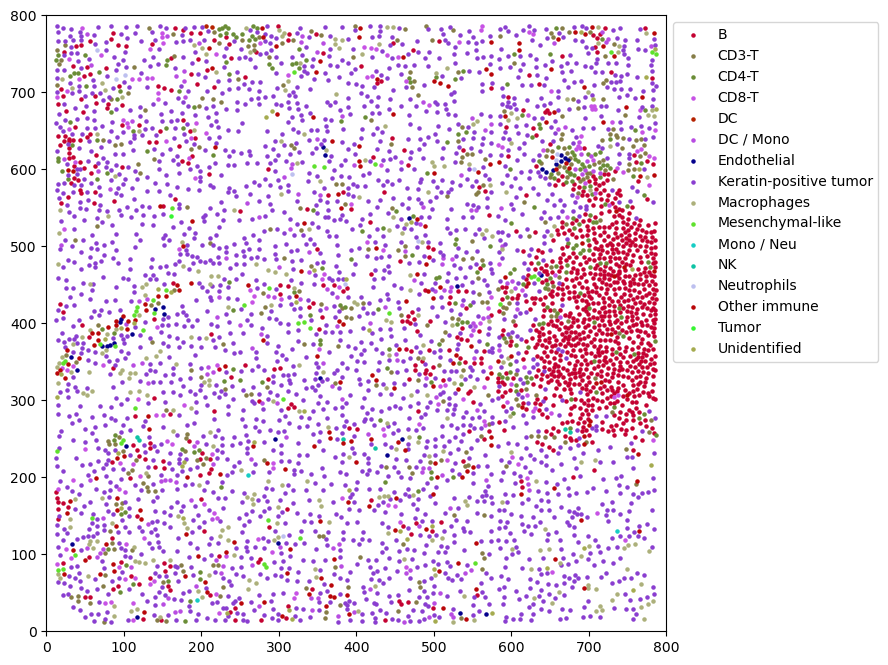

In [5]:
patientID = 1 #38#2 #33
CELL_TYPES = ['CD8-T', 'Other immune', 'DC / Mono', 'CD3-T', 'B', 'NK', 'Keratin-positive tumor', 'Tumor', 
              'CD4-T', 'Mesenchymal-like', 'Macrophages', 'Endothelial', 'Tregs', 'Unidentified', 'DC', 'Mono / Neu', 
              'Neutrophils']

#FIXME change the paths to make it simple to naviage through the datasets !!
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#(" ../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
#print(cell_data['cell_type'].unique(), len(cell_data['cell_type'].unique()))
plt = plot_cells_positions(cell_data, CELL_TYPES, to_plot = 'all',path_fig="../../output/figs/patient{}_cells.svg".format(patientID))#,path_fig ="/scratch/anissa.el/figs/TNBC_patient{}.svg".format(patientID) )
#plt.show()#
#plt.savefig("/scratch/anissa.el/figs/TNBC_patient{}.svg".format(patientID),format="svg")



/scratch/anissa.el/miniconda3/envs/building-blocks/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator PCA from version 0.23.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,


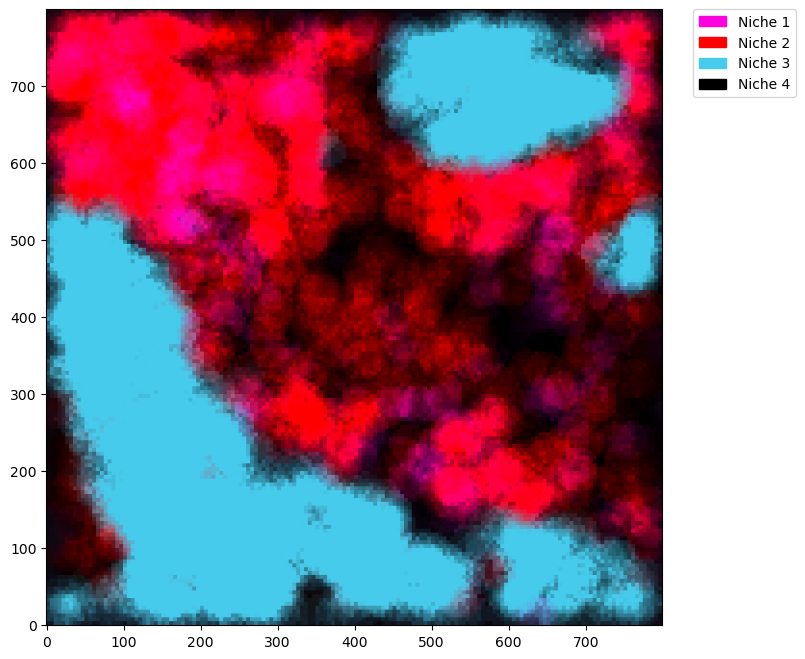

In [6]:
patientID= 4
GRANULARITY = 5
RADIUS = 25

cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#("../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
with open("../../output/pca_3d_gaussian", "rb") as f:
    pca_3d = pickle.load(f)
    

with open("../../output/AA_3D_gaussian", "rb") as f:
    AA_3D = pickle.load(f)

#print(AA_3D.alfa)
plt = plot_cells_positions(cell_data, CELL_TYPES, segment_image=True, counting_type='gaussian',
                           color_vector=COLARCHS,segmentation_type='colors', granularity=GRANULARITY, radius=RADIUS,
                           pca_obj=pca_3d, AA_obj=AA_3D, to_plot = 'None',path_fig= "../../output/figs/TNBC_TMENSpatient{}.svg")
                           
#plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
#                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
#                              intf=["arch2","arch3"],normalize=False,quant=0.9)#,path_fig="../../output/figs/cells_patient"+str(patientID)+"_InflCancer_bordersMax.svg")
                           
#cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#(" ../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
#print(cell_data['cell_type'].unique(), len(cell_data['cell_type'].unique()))
#plt = plot_cells_positions(cell_data, CELL_TYPES, to_plot = 'all',path_fig="../../output/figs/patient{}_cells.svg".format(patientID))#,path_fig ="/scratch/anissa.el/figs/TNBC_patient{}.svg".format(patientID) )
#plt.show()#
                           

['CD8-T' 'Macrophages' 'Other immune' 'Keratin-positive tumor' 'Tumor'
 'Mono / Neu' 'Endothelial' 'Mesenchymal-like' 'CD4-T' 'CD3-T' 'DC / Mono'
 'Tregs' 'Unidentified' 'Neutrophils' 'DC' 'B' 'NK'] 17


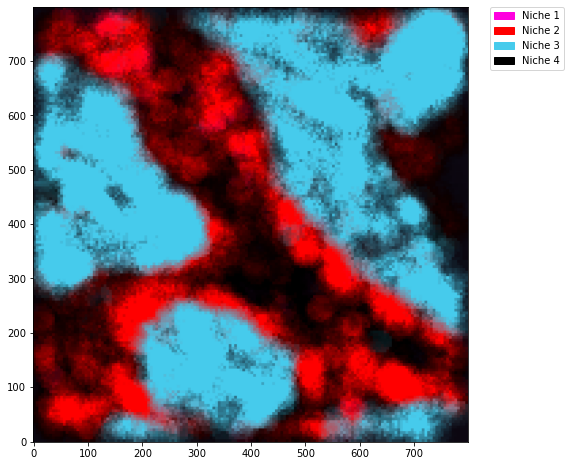

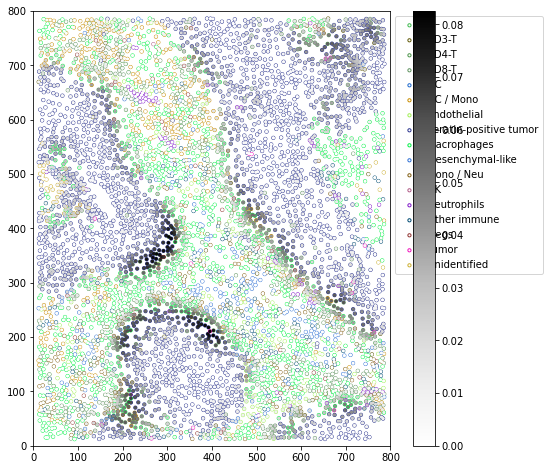

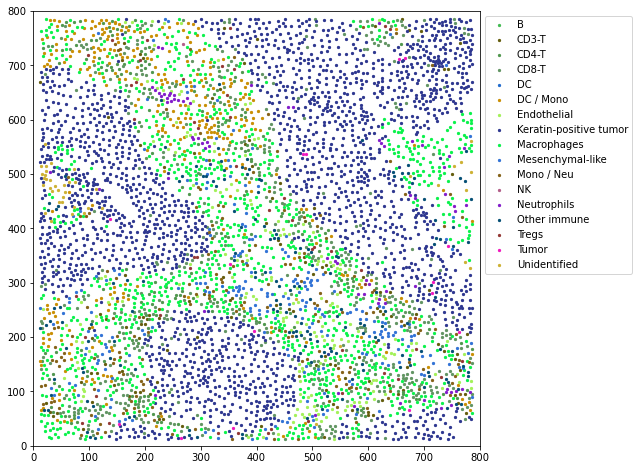

In [6]:
patientID= 5
GRANULARITY = 5
RADIUS = 25

cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#("../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
with open("../../output/pca_3d_gaussian", "rb") as f:
    pca_3d = pickle.load(f)
    

with open("../../output/AA_3D_gaussian", "rb") as f:
    AA_3D = pickle.load(f)

#print(AA_3D.alfa)
COLARCHS = np.array([[255, 0, 223],[255,0,0],[70,203,236],[0,0,0]])    
plt=plot_cells_positions(cell_data, CELL_TYPES, segment_image=True, counting_type='gaussian',
                         color_vector=COLARCHS,segmentation_type='colors', granularity=GRANULARITY, radius=RADIUS,
                           pca_obj=pca_3d, AA_obj=AA_3D, to_plot = 'None',path_fig= "../../output/figs/TNBC_TMENSpatient{}.svg")
#plt.savefig("../../output/figs/TNBC_TMENSpatient{}.svg")                           
plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
                              intf=["arch2","arch3"],normalize=False,quant=0,path_fig="../../output/figs/cells_patient"+str(patientID)+"_InflCancer_borders.svg")
                           
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#(" ../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
print(cell_data['cell_type'].unique(), len(cell_data['cell_type'].unique()))
plt = plot_cells_positions(cell_data, CELL_TYPES, to_plot = 'all',path_fig="../../output/figs/patient{}_cells.svg".format(patientID))#,path_fig ="/scratch/anissa.el/figs/TNBC_patient{}.svg".format(patientID) )
#plt.show()#

<module 'matplotlib.pyplot' from '/scratch/anissa.el/miniconda3/envs/building-blocks/lib/python3.7/site-packages/matplotlib/pyplot.py'>

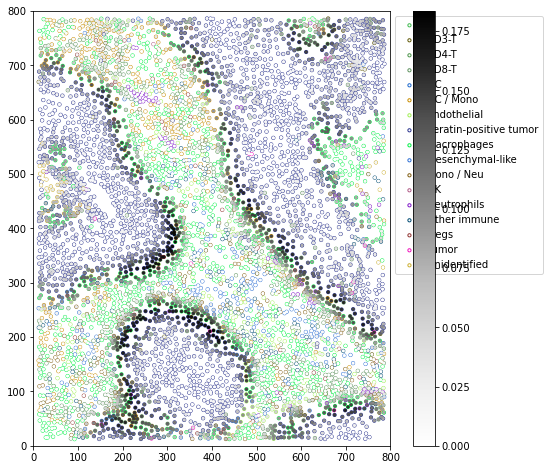

In [7]:
patientID= 5
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))

plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
                              intf=["arch2","arch3"],normalize=True,quant=0,path_fig="../../output/figs/cells_patient"+str(patientID)+"_InflCancer_bordersN.svg")

No handles with labels found to put in legend.


count    8.212000e+03
mean     6.666976e-02
std      6.392686e-02
min     -1.475889e-17
25%      5.397900e-03
50%      4.804298e-02
75%      1.202852e-01
max      2.328651e-01
Name: interface, dtype: float64
['Keratin-positive tumor' 'CD8-T' 'CD3-T' 'CD4-T' 'DC' 'B' 'NK'
 'Neutrophils' 'Other immune' 'Macrophages' 'DC / Mono' 'Endothelial'
 'Tregs' 'Mono / Neu' 'Mesenchymal-like'] 15


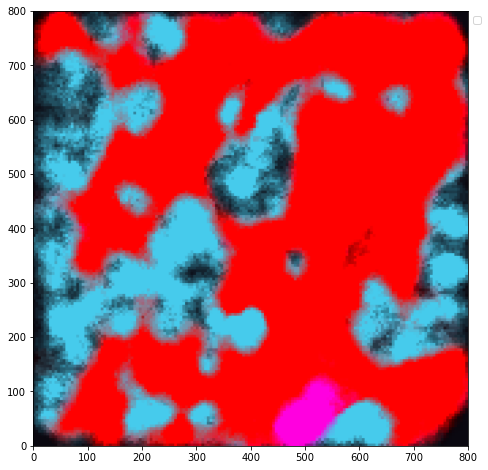

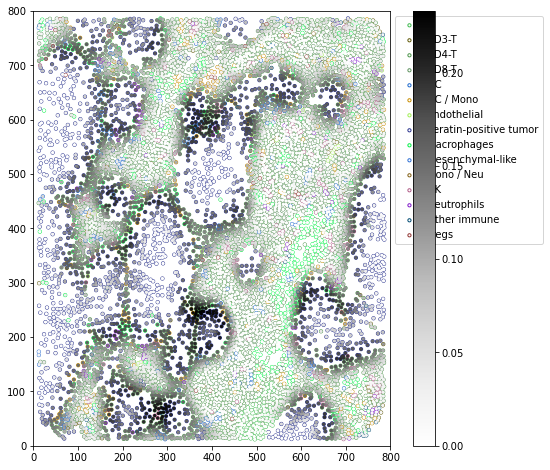

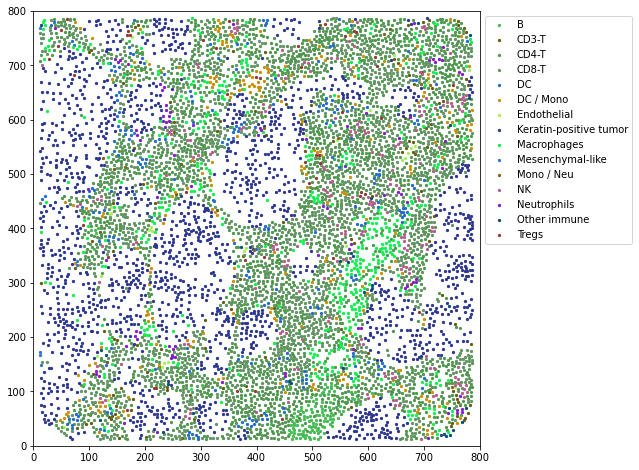

In [14]:
patientID= 16
GRANULARITY = 5
RADIUS = 25

cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
with open("../../output/pca_3d_gaussian", "rb") as f:
    pca_3d = pickle.load(f)
    

with open("../../output/AA_3D_gaussian", "rb") as f:
    AA_3D = pickle.load(f)

#print(AA_3D.alfa)  
plt = plot_cells_positions(cell_data, CELL_TYPES, segment_image=True, counting_type='gaussian',
                           color_vector=COLARCHS,segmentation_type='colors', granularity=GRANULARITY, radius=RADIUS,
                           pca_obj=pca_3d, AA_obj=AA_3D, to_plot = 'None',path_fig= "../../output/figs/TNBC_TMENSpatient{}.svg")
                           
plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
                              intf=["arch2","arch3"],normalize=False,quant=0.9)
                           
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
print(cell_data['cell_type'].unique(), len(cell_data['cell_type'].unique()))
plt = plot_cells_positions(cell_data, CELL_TYPES, to_plot = 'all',path_fig="../../output/figs/patient{}_cells.svg".format(patientID))
plt.show()#

count    5.406000e+03
mean     6.098383e-01
std      2.152399e-01
min     -1.132254e-20
25%      4.276885e-01
50%      6.405638e-01
75%      7.961256e-01
max      1.000000e+00
Name: interface, dtype: float64
count    8.212000e+03
mean     2.012957e-01
std      1.766454e-01
min     -2.220446e-16
25%      7.917594e-03
50%      1.837983e-01
75%      3.321916e-01
max      7.994252e-01
Name: interface, dtype: float64


<module 'matplotlib.pyplot' from '/scratch/anissa.el/miniconda3/envs/building-blocks/lib/python3.7/site-packages/matplotlib/pyplot.py'>

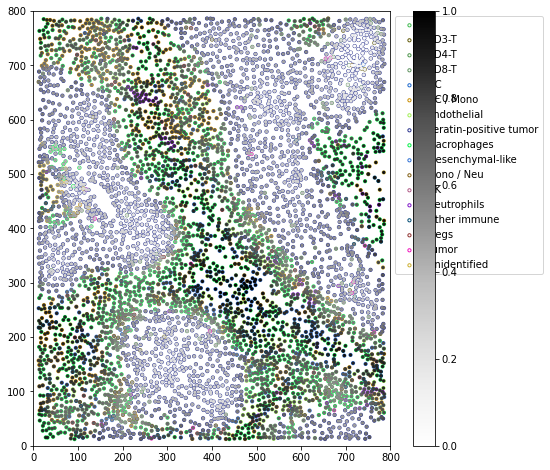

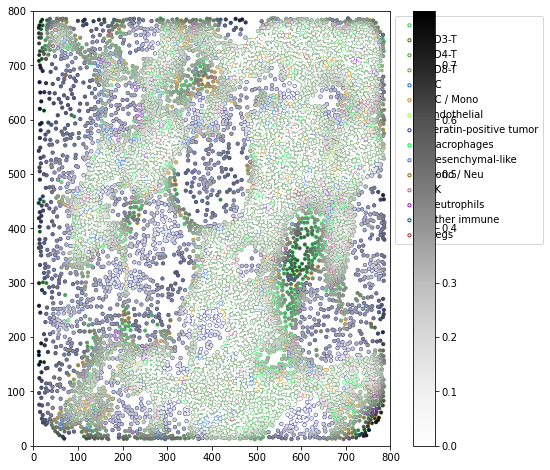

In [12]:
patientID=5
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))

plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
                              intf="arch4",normalize=False,quant=0)#,path_fig="../../output/figs/cells_patient"+str(patientID)+"_InflCancer_bordersMax.svg")

patientID=16
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))

plot_cells_TI_border(cell_data, CELL_TYPES, patientID=patientID,
                              data_niches_path ='../../output/archetypes_sites_centered_all_cells_gaussian.csv',
                              intf="arch4",normalize=False,quant=0)

In [ ]:
patientID = 17
GRANULARITY = 5
RADIUS = 25

cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))#("../../../output/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
with open("../../output/pca_3d_gaussian", "rb") as f:
    pca_3d = pickle.load(f)
    

with open("../../output/AA_3D_gaussian", "rb") as f:
    AA_3D = pickle.load(f)

#print(AA_3D.alfa)
    
plt = plot_cells_positions(cell_data, CELL_TYPES, segment_image=True, counting_type='gaussian',
                           segmentation_type='colors', granularity=GRANULARITY, radius=RADIUS,
                           pca_obj=pca_3d, AA_obj=AA_3D, to_plot = 'None',path_fig= "../../output/figs/TNBC_TMENSpatient{}.svg".format(patientID))
#plt.show()


[[ 27. 158. 119.]
 [217.  95.   2.]
 [117. 112. 179.]
 [231.  41. 138.]]
True


No handles with labels found to put in legend.


(2125, 5)
ok


<module 'matplotlib.pyplot' from '/scratch/anissa.el/miniconda3/envs/building-blocks/lib/python3.7/site-packages/matplotlib/pyplot.py'>

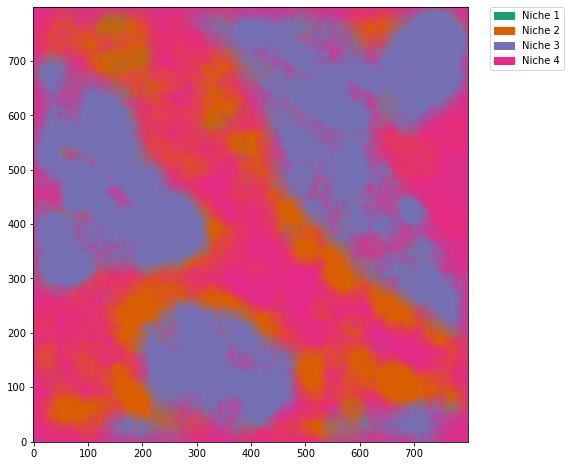

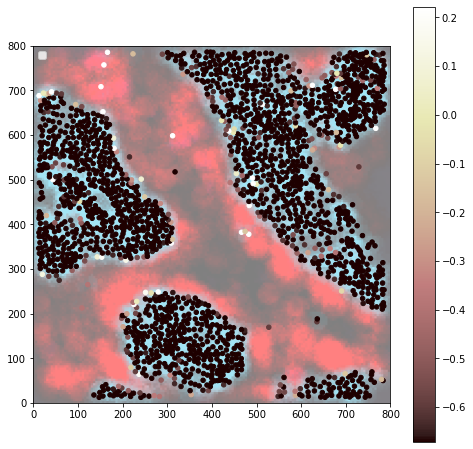

In [9]:
patientID = 16
GRANULARITY = 5
CELLT="Tregs"
CELLT="DC"
CELLT="Macrophages"
CELLT="B"
CELLT="Keratin-positive tumor"
CELLT="Tumor"
CELLT="Neutrophils"
CELLT="DC"
Marker = "IDO"
Marker = "phospho-S6"
Marker = "Keratin6"
Marker = "HLA_Class_1"
Marker = "CD45RO"
Marker = "HLA-DR"
Marker = "PD-L1"
Marker = ["CD45RO","Keratin6","HLA_Class_1"]#["CD45RO"]#,"HLA_Class_1"]
symb = ["^","green","s"]#["X","d","^"]
#Cross: CD45RO >0, Square: Keratin6>0, Triangle: MHCI>0
# marker= "o",fillstyle = "none"
# CD45RO marker= "X"
# Keratin6  marker = "d" thin diamond==> green big circle
# MHCI marker= "^"==> unfilled square 
#plot_cells_markers_tmens(patient_id=patientID,cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
#                         data_markers_path="../../data/cellData.csv",
#                         cell_type=CELLT, marker=Marker,symbols=symb,col="green",
#                         segment_image = True, segmentation_type="smooth",
#                         counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
#                         pca_obj = pca_3d,AA_obj = AA_3D,
#                         to_plot=[],#path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_MHC1Keratin6CD45RO.svg",
#path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
#                        intOutQuant=0.01)


patientID=13
patientID=39
patientID= 5
CELLT="Keratin-positive tumor"
Marker="HLA-DR"#"IDO"
cell_data = pd.read_csv("../../data/cell_positions_data/patient{}_cell_positions.csv".format(patientID))
plt = plot_cells_positions(cell_data, CELL_TYPES, segment_image=True, counting_type='gaussian',
                           segmentation_type='colors', granularity=GRANULARITY, radius=RADIUS,
                           pca_obj=pca_3d, AA_obj=AA_3D, to_plot = 'None')#,path_fig= "../../output/figs/TNBC_TMENSpatient{}.svg")
    
plot_cells_markers_tmens(patient_id=patientID,cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                         data_markers_path="../../data/cellData.csv",
                         marker=Marker,cell_type=CELLT,symbols=[],
                         segment_image = True, segmentation_type="smooth",
                         counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                         pca_obj = pca_3d,AA_obj = AA_3D,
                         to_plot=[],path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
#path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                        intOutQuant=0.01)

In [ ]:
#patientID=13
#patientID=39
GRANULARITY = 5
CELLT="Keratin-positive tumor"
Marker="IDO"
IDs = [17,5,16,17,16,5,35]
CTs = ["B","Keratin-positive tumor","Keratin-positive tumor","Macrophages","DC","Neutrophils","Keratin-positive tumor"]
markers  = ["HLA-DR","HLA-DR","HLA_Class_1","CD45RO","Keratin6","PD-L1","HLA_Class_1"]
for i in range(len(IDs)): 
    plot_cells_markers_tmens(patient_id=IDs[i],cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                             data_markers_path="../../data/cellData.csv",
                             marker=markers[i],cell_type=CTs[i],symbols=[],
                             segment_image = True, segmentation_type="smooth",
                             counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                             pca_obj = pca_3d,AA_obj = AA_3D,
                             to_plot=[],path_fig = "../../output/figs/patient"+str(IDs[i])+"_tmens_"+CTs[i]+"_"+markers[i]+".svg",
    #path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                            intOutQuant=0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


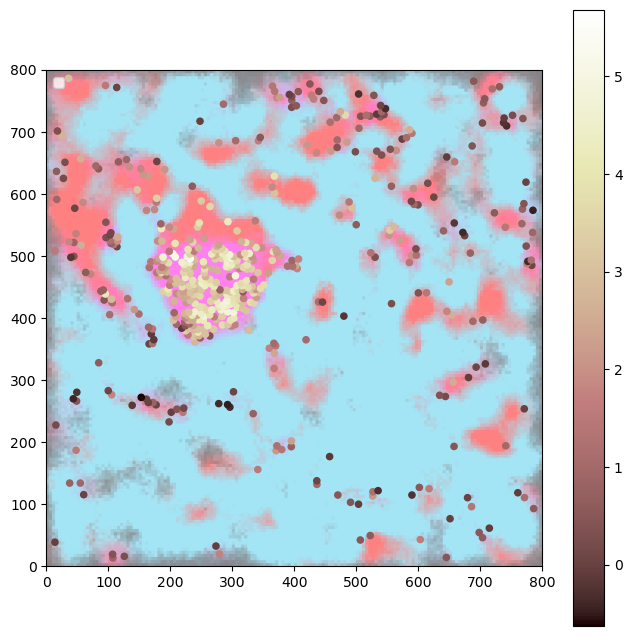

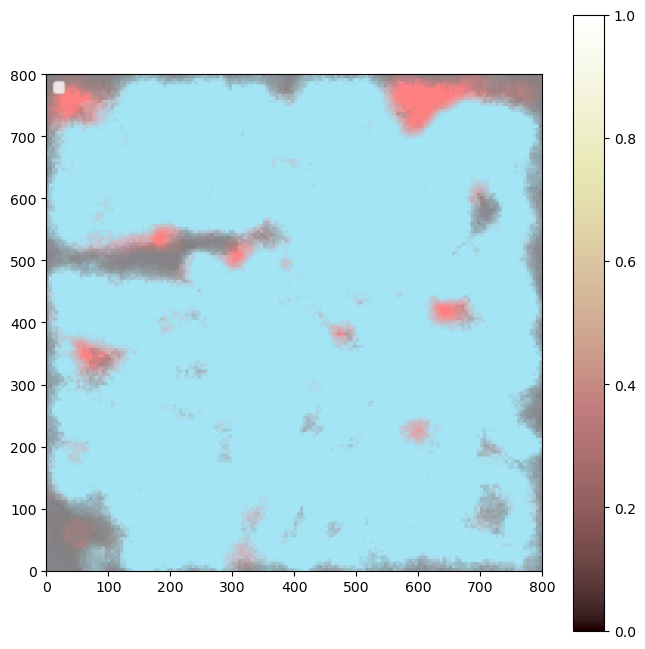

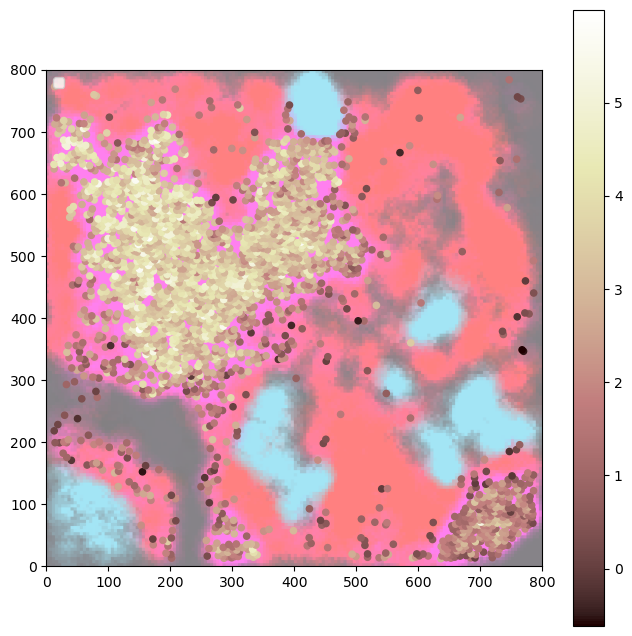

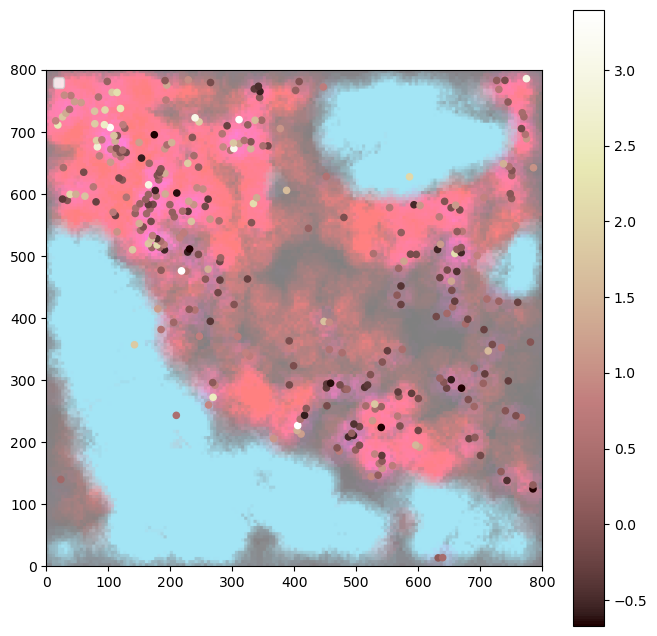

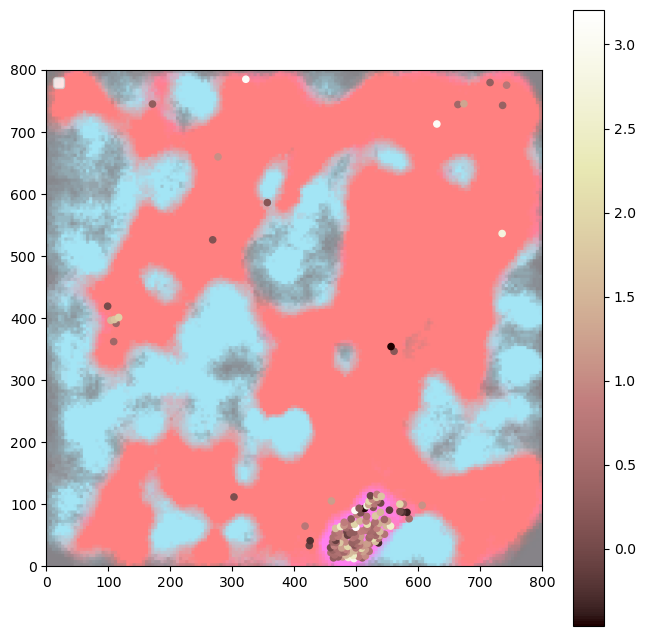

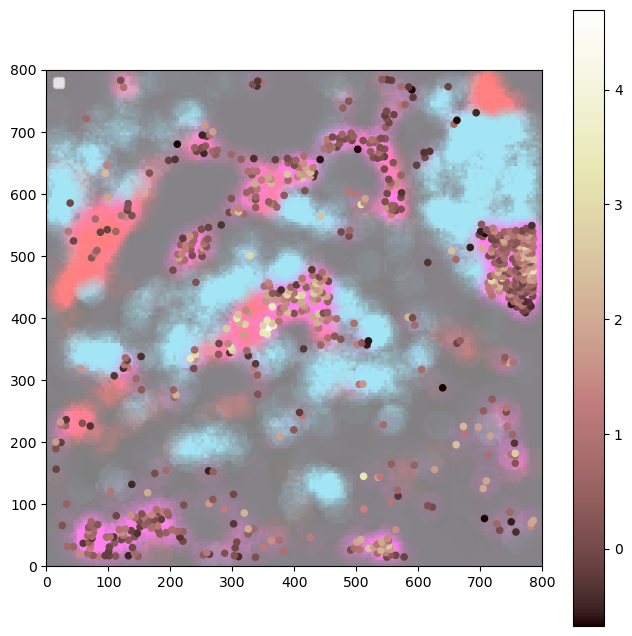

In [12]:
GRANULARITY = 5
CELLT="Keratin-positive tumor"
Marker="IDO"
IDs = [17,14,35,4,16,40]
CTs = ["B"]#,"Keratin-positive tumor","Keratin-positive tumor","Macrophages","DC","Neutrophils"]
markers  = ["HLA-DR"]#,"HLA-DR","HLA_Class_1","CD45RO","Keratin6","PD-L1"]
for i in range(len(IDs)): 
    plot_cells_markers_tmens(patient_id=IDs[i],cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                             data_markers_path="../../data/cellData.csv",
                             marker=markers[0],cell_type=CTs[0],symbols=[],
                             segment_image = True, segmentation_type="smooth",
                             counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                             pca_obj = pca_3d,AA_obj = AA_3D,
                             to_plot=[],#path_fig = "../../output/figs/patient"+str(IDs[i])+"_tmens_"+CTs[i]+"_"+markers[i]+".svg",
    #path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                            intOutQuant=0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


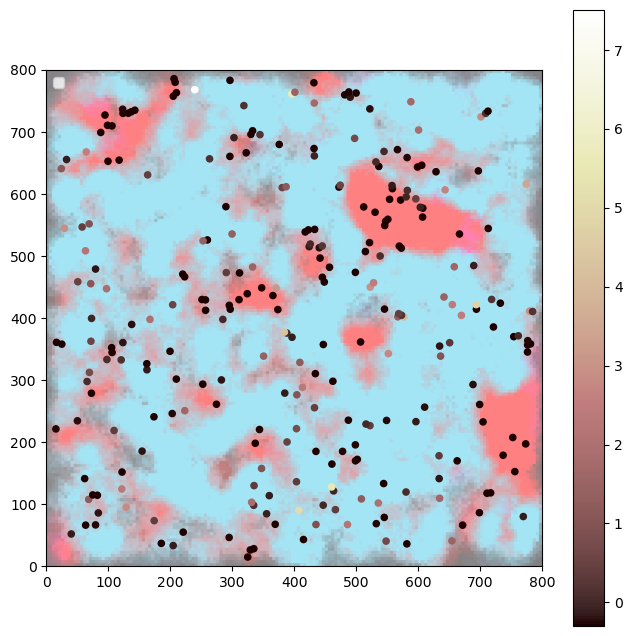

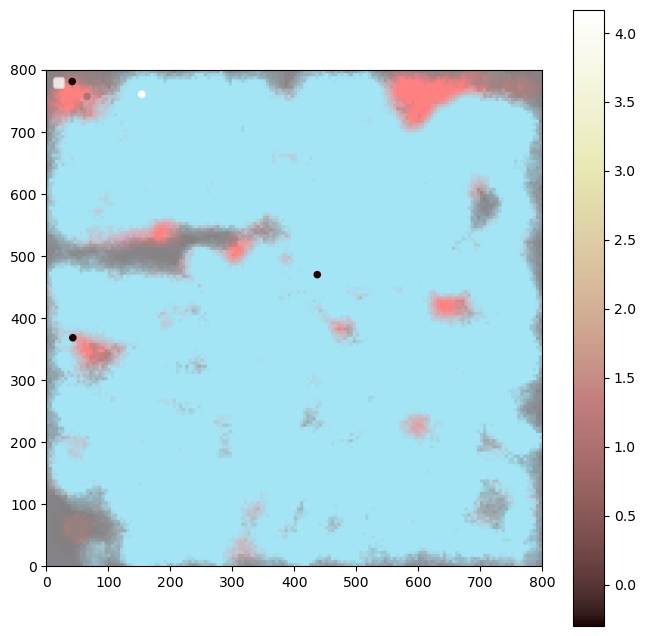

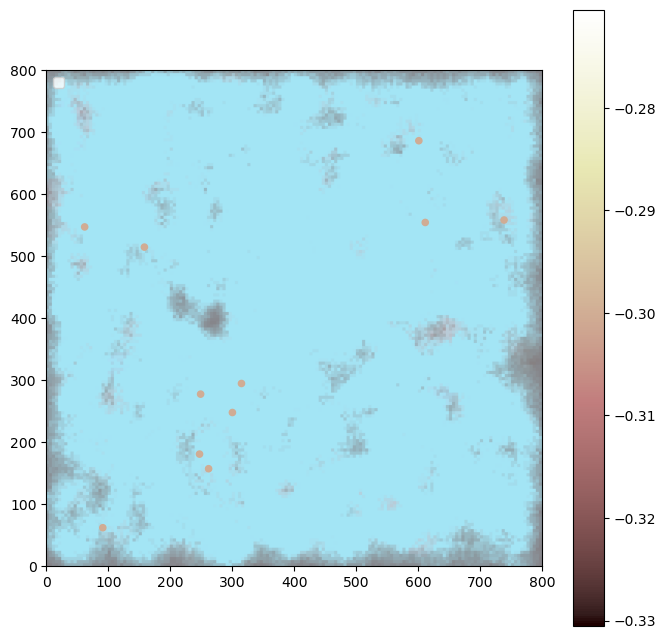

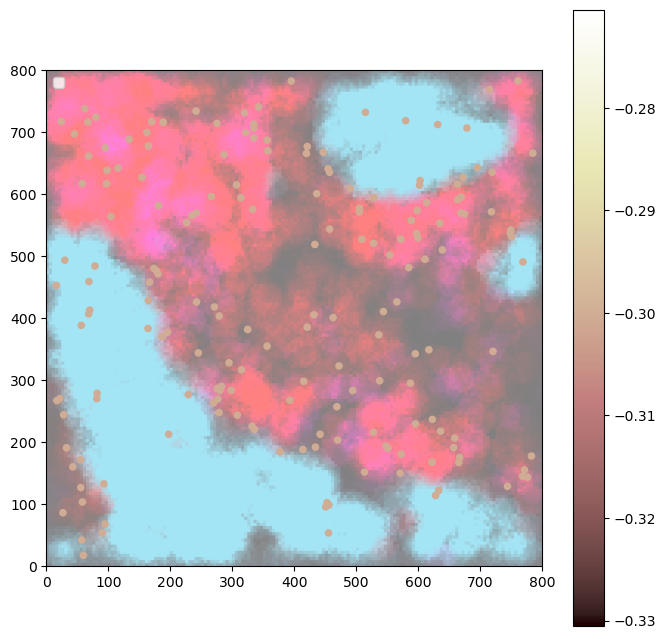

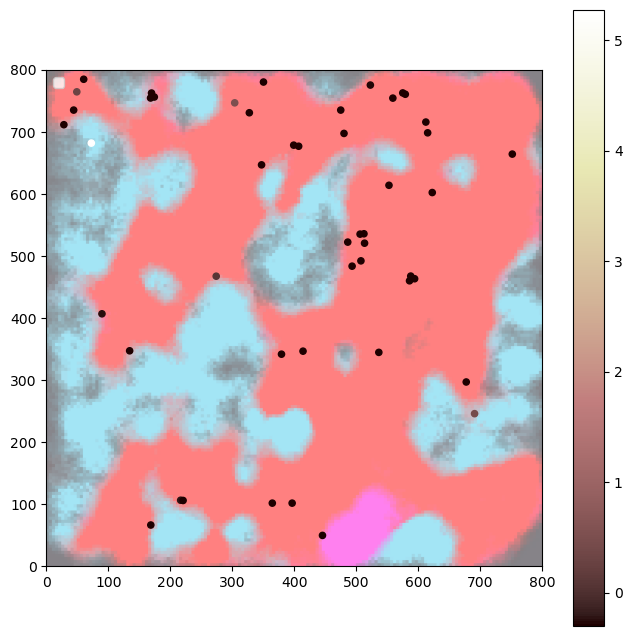

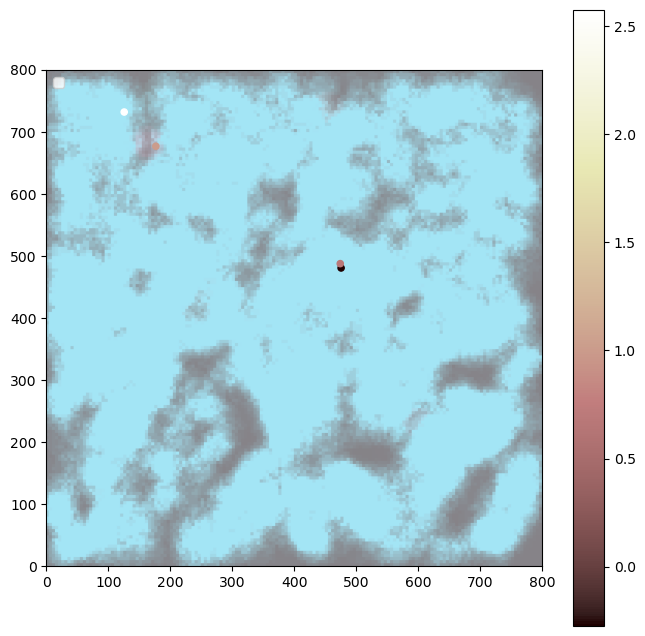

In [7]:
GRANULARITY = 5
IDs = [4,14,11,13,16,24]
CTs = ["Tregs"]#,"Keratin-positive tumor","Keratin-positive tumor","Macrophages","DC","Neutrophils"]
markers  = ["p53"]#,"HLA-DR","HLA_Class_1","CD45RO","Keratin6","PD-L1"]
for i in range(len(IDs)): 
    plot_cells_markers_tmens(patient_id=IDs[i],cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                             data_markers_path="../../data/cellData.csv",
                             marker=markers[0],cell_type=CTs[0],symbols=[],
                             segment_image = True, segmentation_type="smooth",
                             counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                             pca_obj = pca_3d,AA_obj = AA_3D,
                             to_plot=[],#path_fig = "../../output/figs/patient"+str(IDs[i])+"_tmens_"+CTs[i]+"_"+markers[i]+".svg",
    #path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                            intOutQuant=0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


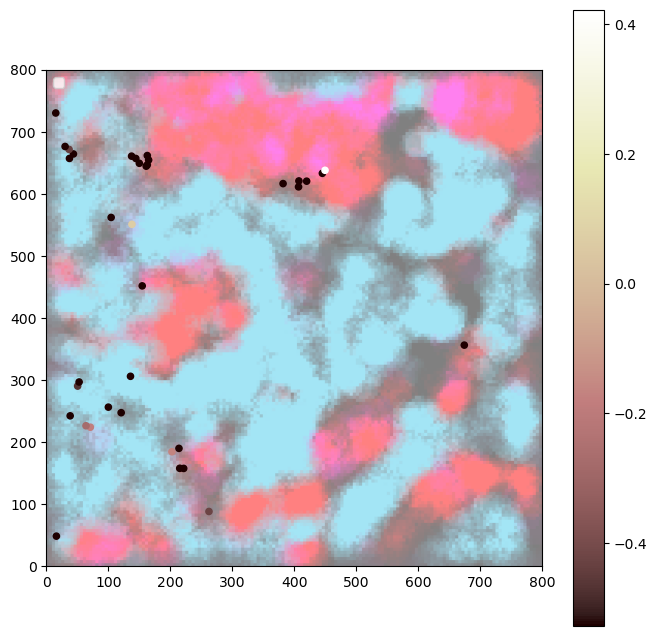

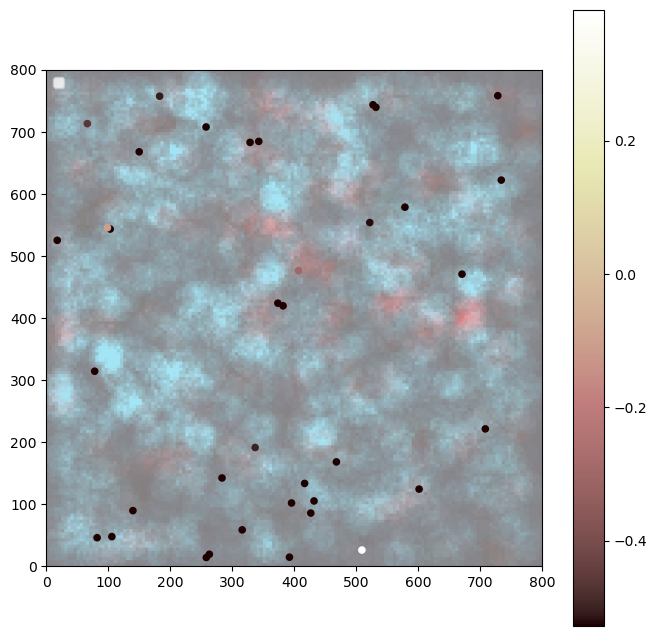

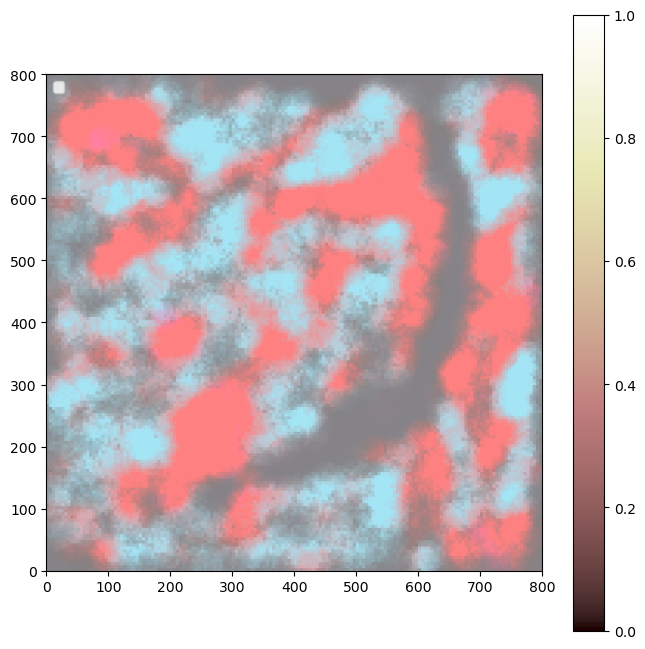

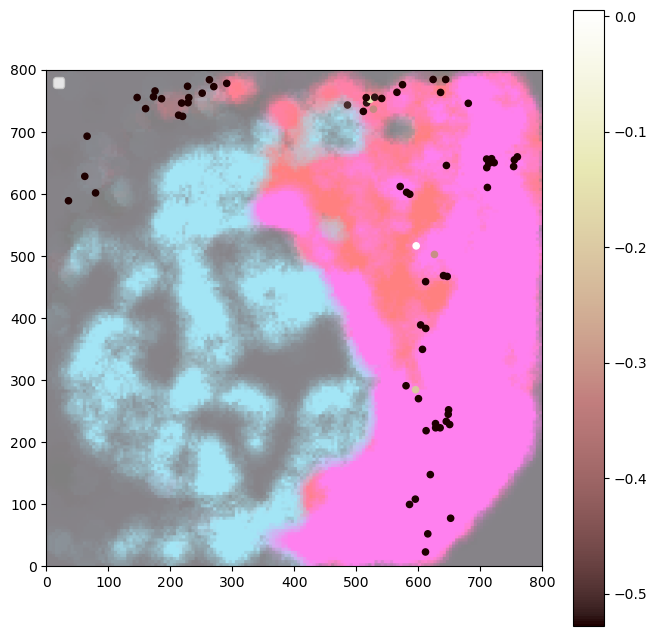

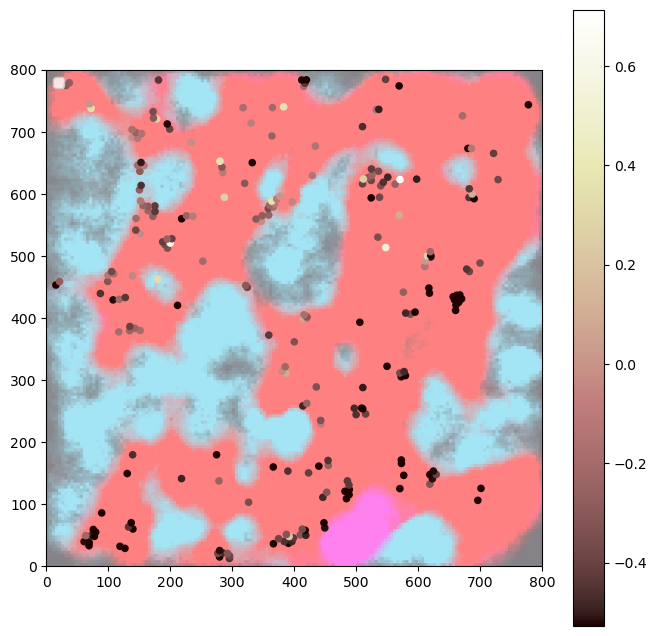

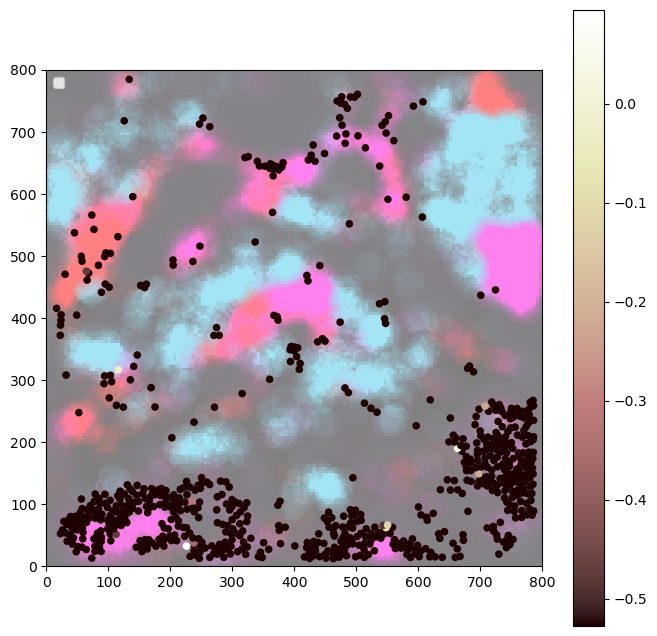

In [7]:
GRANULARITY = 5
IDs = [3,2,32,28,16,40]
CTs = ["DC"]#,"Keratin-positive tumor","Keratin-positive tumor","Macrophages","DC","Neutrophils"]
markers  = ["Keratin6"]#,"HLA-DR","HLA_Class_1","CD45RO","Keratin6","PD-L1"]
for i in range(len(IDs)): 
    plot_cells_markers_tmens(patient_id=IDs[i],cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                             data_markers_path="../../data/cellData.csv",
                             marker=markers[0],cell_type=CTs[0],symbols=[],
                             segment_image = True, segmentation_type="smooth",
                             counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                             pca_obj = pca_3d,AA_obj = AA_3D,
                             to_plot=[],#path_fig = "../../output/figs/patient"+str(IDs[i])+"_tmens_"+CTs[i]+"_"+markers[i]+".svg",
    #path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                            intOutQuant=0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


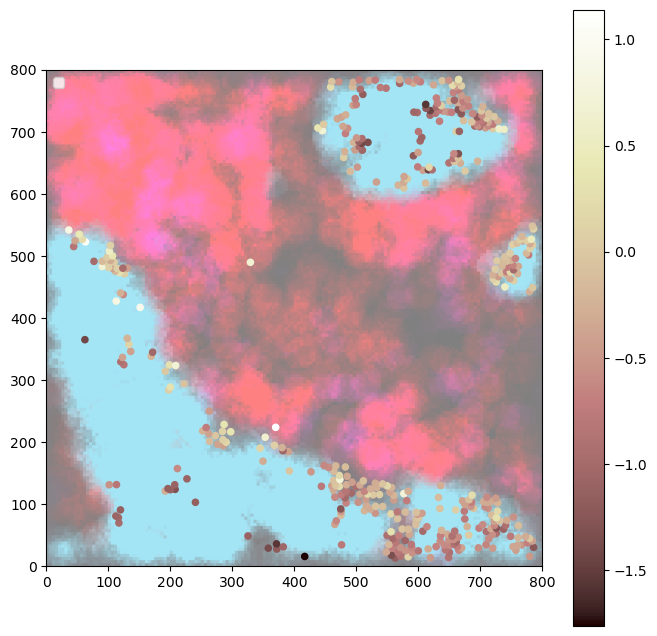

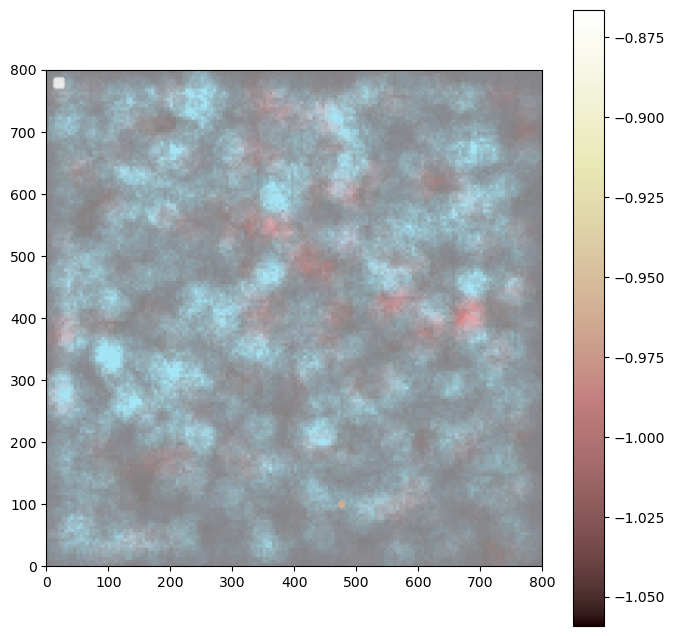

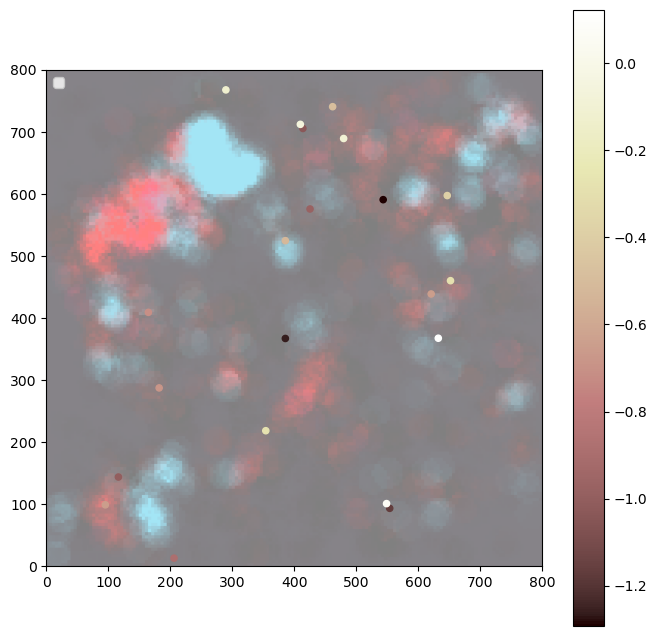

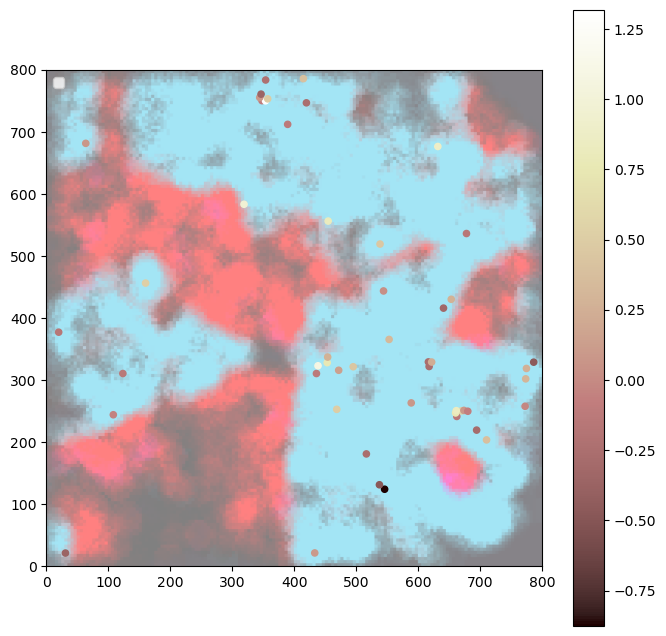

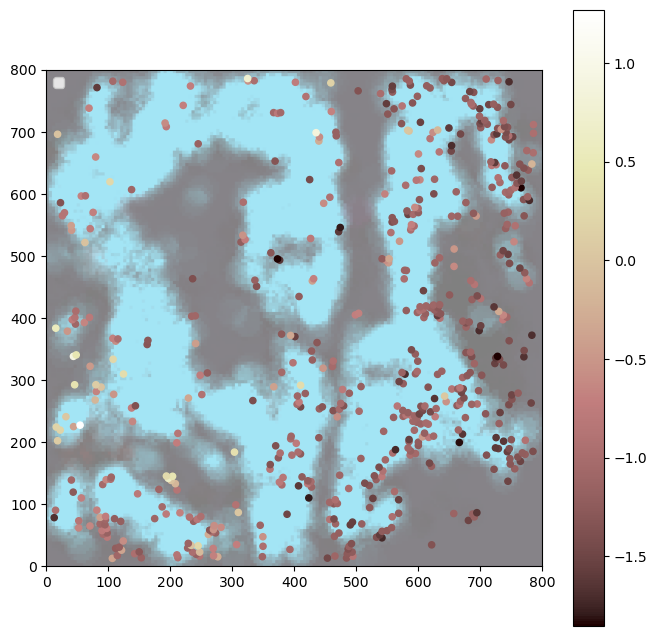

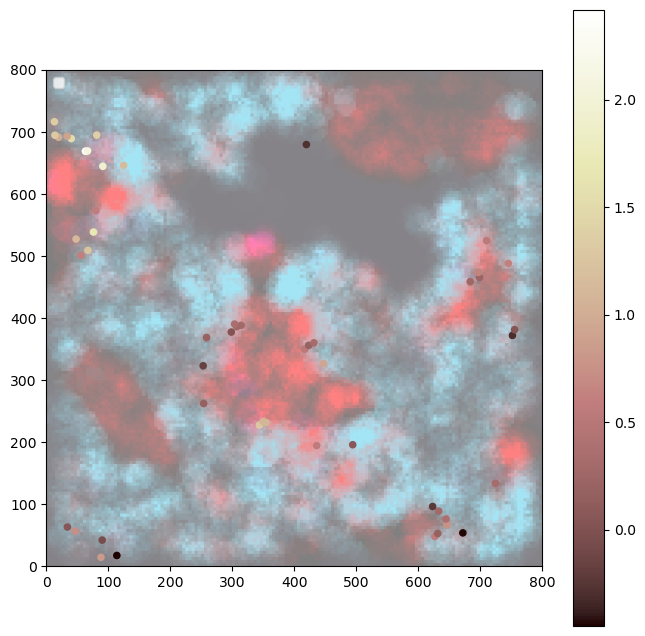

In [9]:
GRANULARITY = 5
IDs = [4,2,36,9,19,39]
CTs = ["Tumor"]#,"Keratin-positive tumor","Keratin-positive tumor","Macrophages","DC","Neutrophils"]
markers  = ["HLA_Class_1"]#,"HLA-DR","HLA_Class_1","CD45RO","Keratin6","PD-L1"]
for i in range(len(IDs)): 
    plot_cells_markers_tmens(patient_id=IDs[i],cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
                             data_markers_path="../../data/cellData.csv",
                             marker=markers[0],cell_type=CTs[0],symbols=[],
                             segment_image = True, segmentation_type="smooth",
                             counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
                             pca_obj = pca_3d,AA_obj = AA_3D,
                             to_plot=[],#path_fig = "../../output/figs/patient"+str(IDs[i])+"_tmens_"+CTs[i]+"_"+markers[i]+".svg",
    #path_fig = "../../output/figs/patient"+str(patientID)+"_tmens_"+CELLT+"_"+Marker+".svg",
                            intOutQuant=0)

In [8]:
GRANULARITY=5
patientID=16
CELLT= "DC"
### Colors
#np.where(hclustID==6,"g",np.where(hclustID==3,"pink",np.where(hclustID==1,"white","grey")))
# Cluster 6(CD45RO++) : green
# Cluster 1 (Keratin6 ++): white ==> brown
# Cluster 3 (HLA CLASS 1 + ): pink
# Other clusters: grey
#plot_cells_hclust_tmens(patient_id=patientID,cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
#                         data_markers_path="../../data/cellData.csv",
#                         cell_type=CELLT,hclust_ids="../../../phenotypes_niches/outputs/DC_hclustIDs.csv",
#                        clustIDs=[6,3,1],cols_clusts=["sienna","white","green","grey"],
#                        segment_image=True,segmentation_type="smooth", 
#                          counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
#                         pca_obj = pca_3d,AA_obj = AA_3D, to_plot=[],path_fig="../../output/figs/"+CELLT+"hclustCells.svg", intOutQuant=0)

In [10]:
granularity=5
patientID= 16
CELLT ="DC"
#plot_cells_alfa_tmens(patient_id=patientID,cell_types=CELL_TYPES,path_data="../../data/cell_positions_data",
#                         data_markers_path="../../data/cellData.csv",
#                         cell_type=CELLT,path_pred_alfas= "../../../phenotypes_niches/outputs/predictedlm_alfa_a2_DC.csv",
#                         segment_image = True, segmentation_type="smooth",
#                         counting_type = "gaussian", h = 800,w = 800,granularity=GRANULARITY,radius = 25,
#                         pca_obj = pca_3d,AA_obj = AA_3D,
#                         to_plot=[],path_fig="../../output/figs/patient"+str(patientID)+"_"+CELLT+"predInfl_alfaCont.svg")

In [ ]:
patient_ids = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
GRANULARITY=3
plot_all_tumors_cell_positions(patient_ids, CELL_TYPES, segment_image = True, segmentation_type = 'rgb',
                               granularity = GRANULARITY, radius = 25, pca_obj = pca_3d, AA_obj = AA_3D,
                               root_path = "../../data/cell_positions_data",to_plot = [])

In [ ]:
#patient_ids = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
#plot_all_tumors_cell_positions(patient_ids, CELL_TYPES, segment_image=True, segmentation_type='hard', granularity=GRANULARITY, radius = 25, pca_obj=pca_3d, AA_obj=AA_3D, to_plot = [])

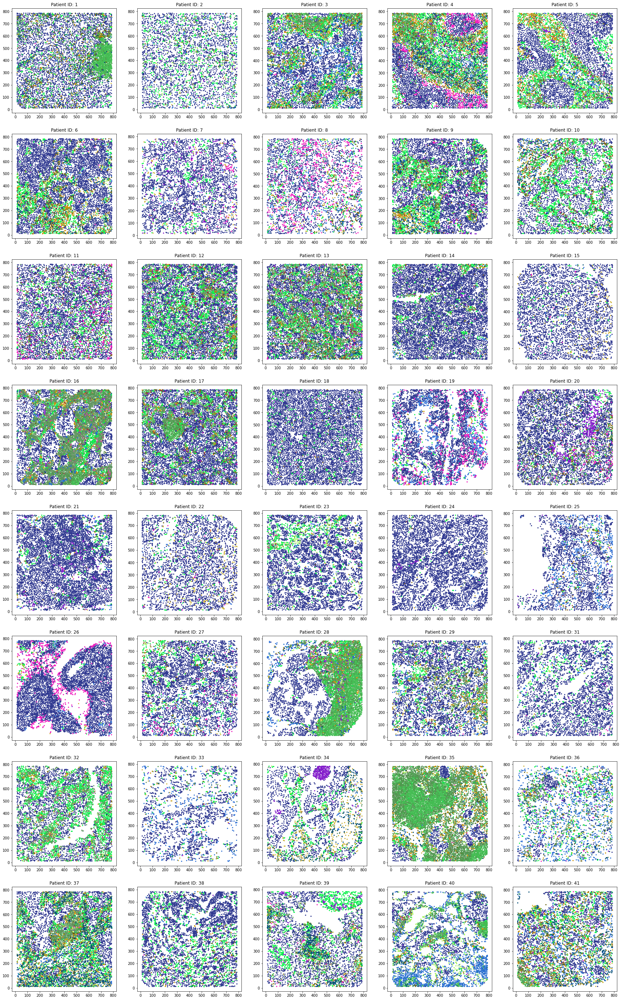

In [6]:
patient_ids = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
GRANULARITY = 30
#FIXME paths to cell data !!
plot_all_tumors_cell_positions(patient_ids, CELL_TYPES, segment_image=False, segmentation_type='rgb',
                               granularity=GRANULARITY,root_path= "../../data/cell_positions_data" ,pca_obj=None, AA_obj=None, to_plot = 'all')